## Introduction

This tutorial introduces the data visualization for flight data. Often, it is hard to obtain flight information unless we scrach airline webpages. Luckily, the [OpenFlights.org](https://openflights.org/data.html) provides free data for individual's usage. However, for commercial use of data, it will require the license fee.

OpenFlight data contain
- Airport database: Name of Airport, City, Country, Latitude, Longitude, ...
- Airline database: Name of Airline, Country, Active, ...
- Route database: Airline, Source / Destination airport, Stops, Plane Type, ...

To have rich presentations of flight data, Geographic information is required, so we can show different flight routes in the map, and do other interesting visualization.

### __Note__: Since this tutorial requires higher version of jupyter notebook for supporting some libraries, be sure that you have minimum jupyter notebook version 5.x


## Outline

We will cover the folowing topics in this tutorial
- [Installing the libraries](#Installing-the-libraries)
- [Exploring dataset](#Exploring-dataset)
- [Data clean](#Data-clean)
- [Example visualization: Route Length](#Example-visualization:-Route-Length)
- [Example visualization: Airport](#Example-visualization:-Airports)
- [Example visualization: Flight Routes with Geographic Information Systems](#Example-visualization:-Flight-Routes-with-Geographic-Information-Systems)

## Installing the libraries

To get started, you will need to install various libraries, because most of them may be new to you and are not used in the class or homework.

A higher-level plotting library : seaborn

    $ conda install -c anaconda seaborn

An interative plotting library : bokeh

    $ conda install bokeh

However, after installing the latest version of bokeh, the minimum supportable notebook version is 5.0. Hence, running the following upgrade command

    $ conda upgrade notebook

__Note__: after upgrading to 5.x, the markdwon table format is changed. Now it becomes left alignment and table style is changed as well. It is not easy to change the format back. Please see [markdown table alignment issue](https://github.com/jupyter/notebook/issues/3024) and [Enforce right-alignment commit](https://github.com/jupyter/notebook/pull/2534#issuecomment-319467135)

Another plot library called pygal is also a good visualization tool.

    $ pip install pygal

__Note__: There are some problems in my computer, which causes fail when installing through conda. Therefore, we can install pygal with pip.

folium provids an interactive Leaflet map, which is useful for geographic information visualization. We use pip to install folium

    $ pip install folium

Word cloud library can resize the word based on the frequency, which is another visualization way to show the frequency distribution. To install the wordcloud library, type the following command

    $ conda install -c conda-forge wordcloud


## Exploring dataset

In [1]:
## Exploring dataset section required library
import pandas as pd
import math

Now, we are ready to explore our dataset. But before that, don't forget to download data from [OpenFlights.org](https://openflights.org/data.html). In this tutorial, we will use __airports__, __airlines__, and __routes__. Because dataset don't include the header, so we have to manually add them into our data.

#### The table for airports (As of January 2017)

| | **airports**             | 
| -- |------------- |
|id |	Unique OpenFlights identifier for this airport.|
|name |	Name of airport. May or may not contain the City name.|
|city | Main city served by airport. May be spelled differently from Name.|
|country | Country or territory where airport is located. See countries.dat to cross-reference to ISO 3166-1 codes.|
|IATA | 3-letter IATA code. Null if not assigned/unknown.|
|ICAO | 4-letter ICAO code. Null if not assigned.|
|lat | Decimal degrees, usually to six significant digits. Negative is South, positive is North.|
|long | Decimal degrees, usually to six significant digits. Negative is West, positive is East.|
|alt | In feet.|
|UTC | Hours offset from UTC. Fractional hours are expressed as decimals, eg. India is 5.5.|
|DST | Daylight savings time. One of E (Europe), A (US/Canada), S (South America), O (Australia), Z (New Zealand), N (None) or U (Unknown).|
|tz | Timezone in "tz" (Olson) format, eg. "America/Los_Angeles".|
|type | Type of the airport. Value "airport" for air terminals, "station" for train stations, "port" for ferry terminals and "unknown" if not known. In airports.csv, only type=airport is included.|
|source	| "OurAirports" for data sourced from OurAirports, "Legacy" for old data not matched to OurAirports (mostly DAFIF), "User" for unverified user contributions. In airports.csv, only source=OurAirports is included.|

#### The table for airlines (As of January 2012)

| | **airlines**             | 
|----------|-------------|
|id | Unique OpenFlights identifier for this airline.|
|name |	Name of the airline.|
|alias | Alias of the airline. For example, All Nippon Airways is commonly known as "ANA".|
|IATA | 2-letter IATA code, if available.|
|ICAO | 3-letter ICAO code, if available.|
|Cal | Airline callsign.|
|country | Country or territory where airline is incorporated.|
|active	| "Y" if the airline is or has until recently been operational, "N" if it is defunct. This field is not reliable: in particular, major airlines that stopped flying long ago, but have not had their IATA code reassigned (eg. Ansett/AN), will incorrectly show as "Y".|

#### The table for routes (As of January 2012)

| | **routes**             | 
|----------|-------------|
|airline | 2-letter (IATA) or 3-letter (ICAO) code of the airline.|
|id | Unique OpenFlights identifier for airline (see Airline).|
|source | 3-letter (IATA) or 4-letter (ICAO) code of the source airport.|
|sourceID | Unique OpenFlights identifier for source airport (see Airport)|
|destination | 3-letter (IATA) or 4-letter (ICAO) code of the destination airport.|
|destinationID | Unique OpenFlights identifier for destination airport (see Airport)|
|code | "Y" if this flight is a codeshare (that is, not operated by Airline, but another carrier), empty otherwise.|
|stops | Number of stops on this flight ("0" for direct) |
|type | 3-letter codes for plane type(s) generally used on this flight, separated by spaces|


In [2]:
# Read data from airports, airlines, and routes and add headers

# read airports
airports = pd.read_csv("airports.dat", header=None)
airports.columns = ["id", "name", "city", "country", "IATA", "ICAO", "lat", "long", "alt", "UTC", "DST", "tz", "type", "source"]

# read airlines
airlines = pd.read_csv("airlines.dat", header=None)
airlines.columns = ["id", "name", "alias", "IATA", "ICAO", "Cal", "country", "active"]

# read routes
routes = pd.read_csv("routes.dat", header=None)
routes.columns = ["airline", "id", "source", "sourceID", "destination", "destinationID", "code", "stops", "type"]

# show airports data
airports.head()

,id,name,city,country,IATA,ICAO,lat,long,alt,UTC,DST,tz,type,source
0,1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081690,145.391998,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
1,2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.207080,145.789001,20,10,U,Pacific/Port_Moresby,airport,OurAirports
2,3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826790,144.296005,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
3,4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
4,5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380,147.220001,146,10,U,Pacific/Port_Moresby,airport,OurAirports


## Data clean

Although the data should be clean and ready to be used, but if you look at them, you will figure out there are some missing data or invalid fields. For example, 

```python
>>> routes[5:].head()

airline	id	source	sourceID	destination	destinationID	code	stops	type
5	2B	410	DME	    4029	    KZN	        2990	        NaN	    0	    CR2
6	2B	410	DME	    4029	    NBC	        6969	        NaN	    0	    CR2
7	2B	410	DME	    4029	    TGK	        \N	          NaN	    0	    CR2
8	2B	410	DME	    4029	    UUA	        6160	        NaN	    0	    CR2
9	2B	410	EGO	    6156	    KGD	        2952	        NaN	    0	    CR2
```

In routes data, __\N__ means the value is unknown. Hence, we need to drop all of row that contains unknow information. At the same time, we remove unneccessary columns, since we may not use in this tutorial.


In [3]:
# clean airports data
for drop_column_by_name in ["tz", "DST", "UTC", "type", "source", "IATA", "ICAO"]:
    if drop_column_by_name in airports.columns:
        airports.drop(drop_column_by_name, axis=1, inplace=True)

airports.reset_index()


# clean airlines data
for drop_column_by_name in ["Cal", "alias", "IATA", "ICAO"]:
    if drop_column_by_name in airlines.columns:
        airlines.drop(drop_column_by_name, axis=1, inplace=True)
        
# drop columns "alias"
if 'alias' in airlines.columns:
    airlines.drop('alias', axis=1, inplace=True)

airlines.reset_index()


# clean routes data
routes = routes[(routes['id'] != "\\N") & (routes['airline'] != "\\N") & (routes['source'] != "\\N")  & \
                (routes['sourceID'] != "\\N") & (routes['destination'] != "\\N") & (routes['destinationID'] != "\\N") \
               ]

# drop columns "type" and "code"
for drop_column_by_name in ["type", "code"]:
    
    if drop_column_by_name in routes.columns:
        routes.drop(drop_column_by_name, axis=1, inplace=True)

        
## Data type transfrom
routes[['sourceID',"destinationID"]] = (
    routes[['sourceID',"destinationID"]].apply(pd.to_numeric)
)

routes.reset_index()

# Now, we remove the unknown information
routes[5:].head()

,airline,id,source,sourceID,destination,destinationID,stops
5,2B,410,DME,4029,KZN,2990,0
6,2B,410,DME,4029,NBC,6969,0
8,2B,410,DME,4029,UUA,6160,0
9,2B,410,EGO,6156,KGD,2952,0
10,2B,410,EGO,6156,KZN,2990,0


## Example visualization: Route Length

The following libraries are what we will use in this section

In [4]:
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')
matplotlib.rcParams['figure.figsize'] = (15.0, 10.0) # you should adjust this to fit your screen

import seaborn

import numpy as np
from bokeh.io import output_notebook
from bokeh.plotting import figure as bkfigure
from bokeh.plotting import show as bkshow

import pygal
from IPython.display import SVG, Image

First, we will show the distribution of route length by airlines. To calculate the distance given latitude and longitue, we use [haversine](https://en.wikipedia.org/wiki/Haversine_formula) formula to determine the great-circle distance between two points.

To get latitude and longitue for airports, we match the sourceID and destinationID in __routes__ to the data in __airports__. Therefore, we will get latitude and longitue for the airpots, and use haversin formula to calculate the distance between airports.

In [5]:
def haversineD(lon1, lat1, lon2, lat2):
    # convert to radians
    lon1, lat1, lon2, lat2 = map(math.radians, [float(lon1), float(lat1), float(lon2), float(lat2)])
    
    # calculate distance
    d_lon = lon2 - lon1
    d_lat = lat2 - lat1
    
    a = math.sin(d_lat/2)**2 + math.cos(lat1) * math.cos(lat2) + math.sin(d_lon/2) ** 2
    
    # R varies from 6356.752 km at the poles to 6378.137 km at the equator, since the earth is not a perfect sphere
    # we get an average value
    R = (6356.752 + 6378.137) / 2
    distanceKM = 2 * R * math.asin(math.sqrt(a))
    
    return distanceKM

def calculate_distance(routes_row):
    
    dist = 0
    
    # since the routes and airports are not consistence, it may happen the IndexError and KeyError
    # we simply set dist to 0
    try:
        source = airports[airports['id'] == routes_row['sourceID']].iloc[0]
        destination = airports[airports['id'] == routes_row['destinationID']].iloc[0]
        dist = haversineD(source['long'], source['lat'], destination['long'], source['lat'])
    except (ValueError, IndexError):
        pass
    
    return dist

route_lengths = routes.apply(calculate_distance, axis=1)

# remove dist 0
route_lengths = route_lengths[route_lengths != 0]

To display the route_lengths, we usually use matplotlib, but another good library called Seaborn, which builds on top of matplotlib, provides a higher-level plotting. __distplot__ function in Seaborn plots a histogram with a kernel density estimate on top of it. The kernel can be seen as a smoothed version of the historgram. The following figure shows two different plots. One is from matplotlib hist and the other is from seaborn distplot.


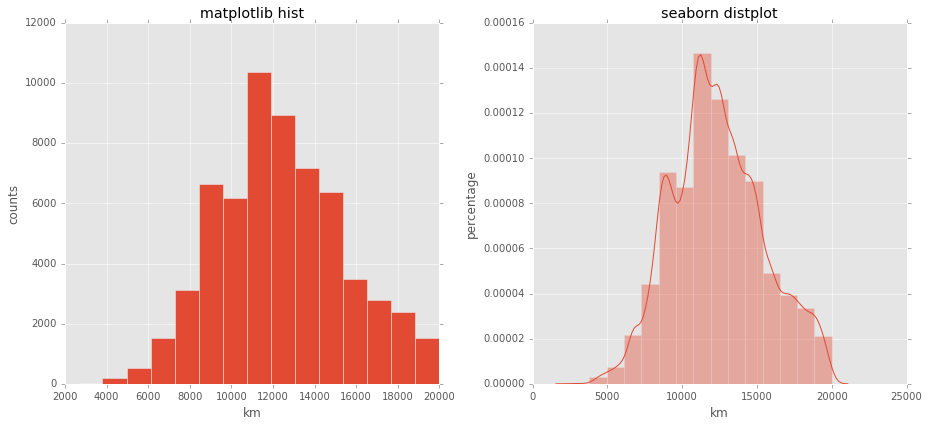

In [6]:
# Set up the matplotlib figure
f, (ax1, ax2) = plt.subplots(figsize=(13,6), ncols=2, nrows=1)

# matplotlib hist
ax1.hist(route_lengths, bins=15)
ax1.set_title("matplotlib hist")
ax1.set_xlabel('km')
ax1.set_ylabel('counts')

seaborn.distplot(route_lengths, bins=15, ax=ax2)
ax2.set_title("seaborn distplot")
ax2.set_xlabel('km')
ax2.set_ylabel('percentage')

plt.tight_layout()

### Route length by airlines

The above length distribution is for all routes, which give us a rough idea about the overall route length. We can also categorize the route length by airlines, and use the average length or boxplot to show the length in each airlines. Since we have many airlines, it is hard to present it in static way. We will use __bokeh__ library to generate a javascript widget in jupyter notebook with interactive mode.

Because we have many route lengths, x_label may interference with each other. With interactive mode, you can zoom in to see the detail for each airlines.

In [7]:
route_length_df = pd.DataFrame({"length": route_lengths, "id": routes["id"]})
# calculate the average length for each airline
airline_route_average = route_length_df.groupby("id").aggregate(np.mean)

def airline_name(route_average):
    name = ""
    try:
        name = airlines["name"][airlines["id"] == route_average["id"]].iloc[0]
    except (IndexError, ValueError):
        pass
    return name
        

# Add index and name of airline for each average route
airline_route_average["id"] = airline_route_average.index
airline_route_average["id"] = airline_route_average["id"].apply(pd.to_numeric)
airline_route_average["name"] = airline_route_average.apply(airline_name, axis=1)

# drop nan value
airline_route_average = airline_route_average[np.isfinite(airline_route_average['length'])]

# bokeh plot
output_notebook()
x_value = airline_route_average["name"].tolist()
p = bkfigure(x_range=x_value, height=250, width=500, title="Average route length per airline")
p.vbar(x=x_value, top=airline_route_average["length"].tolist(), width=0.5)

p.xaxis.axis_label = "Airline"
p.yaxis.axis_label = "length (km)"

bkshow(p)

Loading BokehJS ...

If you don't run this tutorial, you may not be able to see the above figure. Therefore, the print screen is shown below.

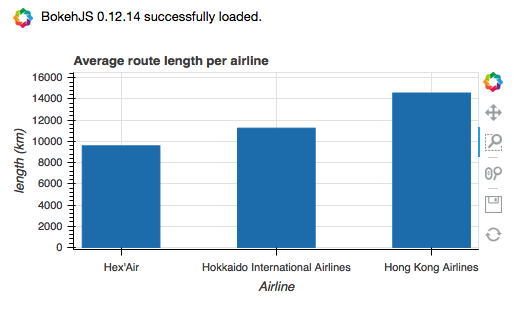

In [8]:
Image(filename='Average_route.png')

The final presentation of route length is bar charts (percentage) for short, medium and long distance. The short, medium and long can be defined by yourself. Here, we will use pre-defined values for them.

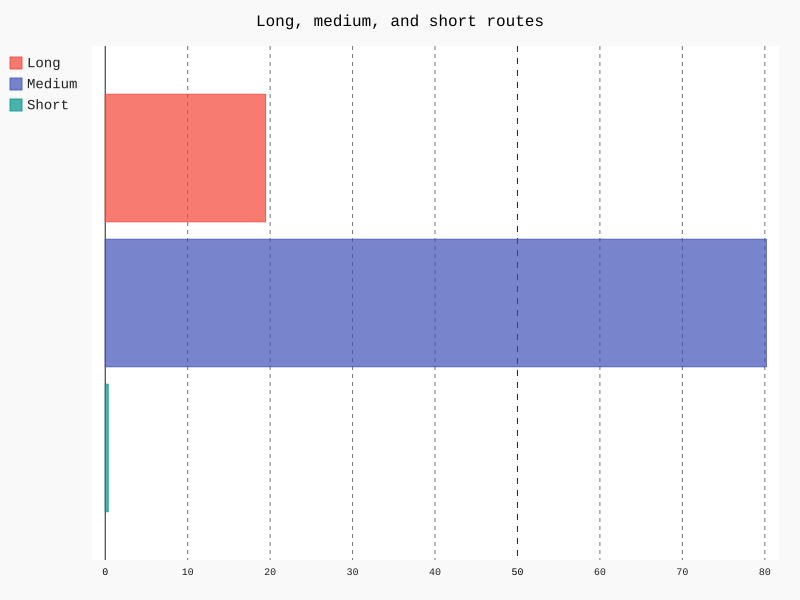

In [9]:
SHORT = 5000
MEDIUM = 15000
TOTAL = len(route_lengths)

long_routes = 0
medium_routes = 0
short_routes = 0

for d in route_lengths.tolist():
    #print(d, type(d))
    
    if d >= MEDIUM:
        long_routes += 1
    elif d < MEDIUM and d >= SHORT:
        medium_routes += 1
    else:
        short_routes += 1

long_routes = (long_routes / TOTAL) * 100
medium_routes = (medium_routes / TOTAL) * 100
short_routes = (short_routes / TOTAL) * 100

bar = pygal.HorizontalBar()
bar.title = "Long, medium, and short routes"
bar.add("Long", long_routes)
bar.add("Medium", medium_routes)
bar.add("Short", short_routes)
bar.render_to_file('routes.svg')

SVG(filename='routes.svg')


## Example visualization: Airports
The following libraries are used in this section

In [10]:
from mpl_toolkits.basemap import Basemap
import folium

In addition to routes data, airports have latitude and longitude pairs. We can use and plot them in the map. To do this, we use the basemap library, which enables drawing world maps by latitude and longitue pairs.

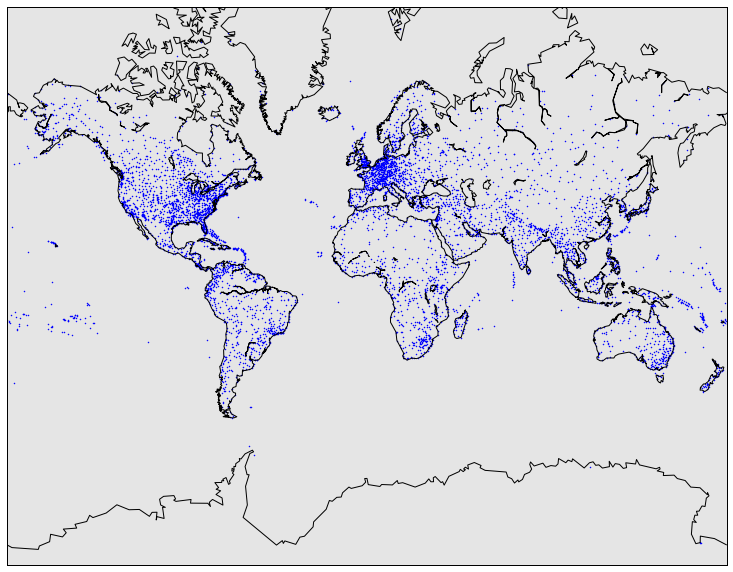

In [11]:
m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
m.drawcoastlines()
m.drawmapboundary()

# Convert latitude and longitude
x, y = m(list(airports["long"].astype(float)), list(airports["lat"].astype(float)))
# Draw the points onto the map.
m.scatter(x,y,1,marker='o',color='blue')
plt.show()

The above figure is static. When we have a lot of data, it is hard to present them in a signal plot. Therefore, we can use an alternative approach: interactive mode. folium is a great library for user interaction. We can zoom into the map and find the interest of area. In folium, it has a popup attribute, which enables you to put information on the marker. This is really helpful when you have descriptions, but can't fit into the map.

In [12]:
airports_map = folium.Map(location=[30, 0], zoom_start=2)

for name, row in airports.iterrows():

    popup = folium.Popup(row["name"], parse_html=True)
    folium.CircleMarker(location=[row["lat"], row["long"]], popup=popup, radius=3).add_to(airports_map)

airports_map.save('airports.html')
airports_map

If you don't run this tutorial, you may not see the above figure. The print screen is provided below

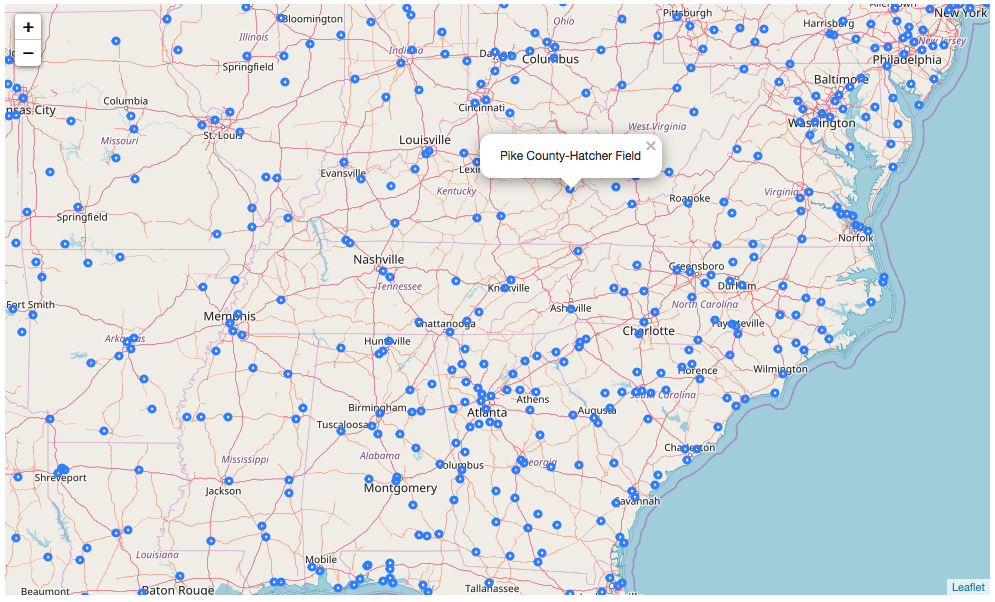

In [13]:
Image(filename='folium_airports.png')

## Example visualization: Flight Routes with Geographic Information Systems

In [14]:
from wordcloud import WordCloud
import re

In the previous section, we use the route length to demonstrate the statistic of routes. Another interesting visualization way is to connect the points of source and destination. However, the routes may be too many to present in the map, so we will show the first 2000 routes.

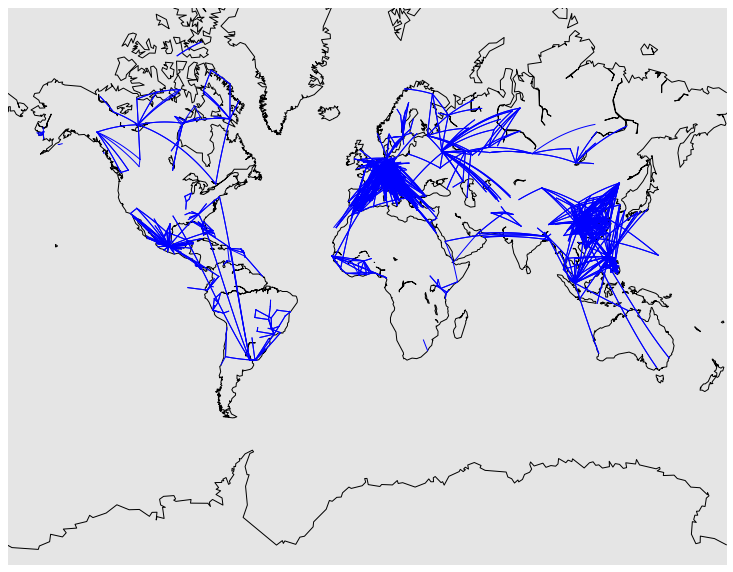

In [15]:
m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')
m.drawcoastlines()

# Get the first 2000
for name, row in routes[:2000].iterrows():
    try:
        # Get the source and dest airports.
        source = airports[airports["id"] == row["sourceID"]].iloc[0]
        destination = airports[airports["id"] == row["destinationID"]].iloc[0]
        # Don't draw long routes to prevent obscuring the other routes
        if abs(float(source["long"]) - float(destination["long"])) < 60:
            m.drawgreatcircle(float(source["long"]), float(source["lat"]), float(destination["long"]), float(destination["lat"]),linewidth=1,color='b')
    except (ValueError, IndexError):
        pass
    
# Show the map.
plt.show()

The final part is to show hottest source airport and destination airport. We can use the bar chart to show the distribution, but we also can use word cloud to show the hottest airport.

In [16]:
source_airport = []
destination_airport = []

for name, row in routes[:2000].iterrows():
    try:
        # Get source airport name
        source = airports[airports["id"] == row["sourceID"]].iloc[0]
        if re.match(r'^[\w\s]+$', source['name']):
            source_airport.append(source['name'].split()[0])
        
        # Get destination airport name
        destination = airports[airports["id"] == row["destinationID"]].iloc[0]
        if re.match(r'^[\w\s]+$', destination['name']):
            destination_airport.append(destination['name'].split()[0])
        
    except (ValueError, IndexError):
        pass

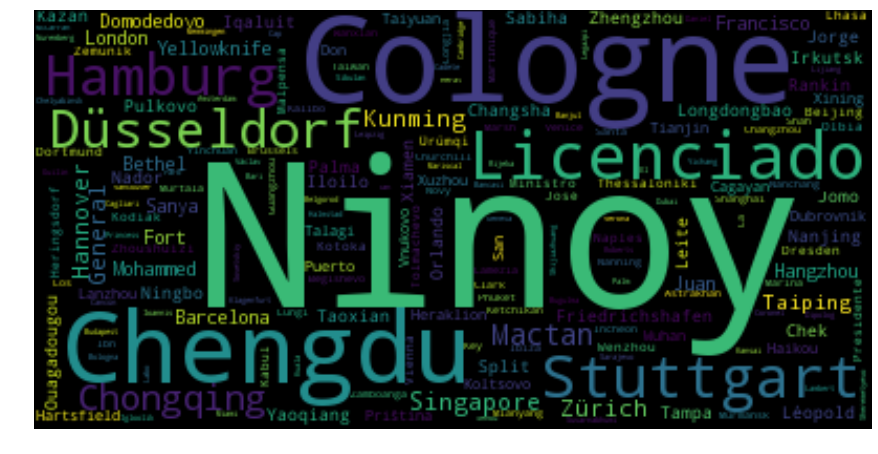

In [17]:
wordcloud = WordCloud(collocations=False).generate(" ".join(source_airport))

plt.imshow(wordcloud)
plt.axis("off")
plt.show()

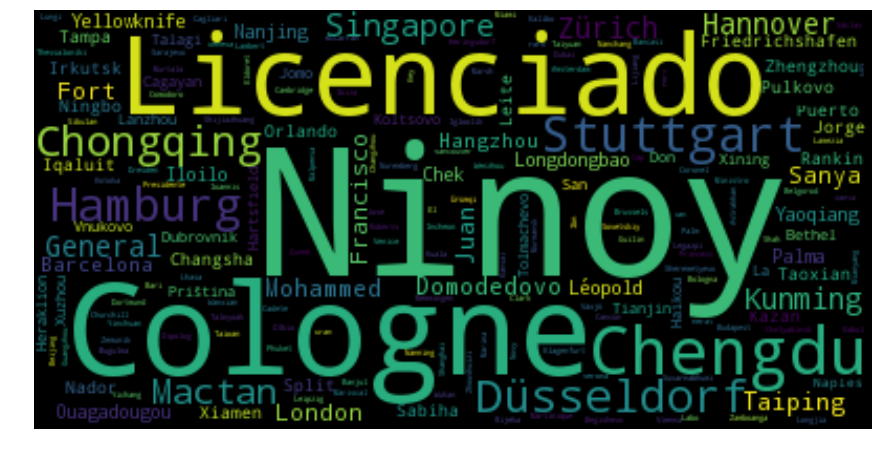

In [18]:
wordcloud = WordCloud(collocations=False).generate(" ".join(destination_airport))

plt.imshow(wordcloud)
plt.axis("off")
plt.show()